<a href="https://colab.research.google.com/github/kahram-y/first-repository/blob/master/DeepLearning/flowerpred.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **VGG16 기반 꽃이미지 분류 모델 만들기**

꽃이미지는 tensorflow 제공
(데이터 용량은 218.21 MiB,
총 3,670개의 examples로 이루어짐)

✨ 정확도를 올리기 위해 적용한 기술들:
1. Data Augmentation(데이터 증강) 추가

    꽃 데이터는 각 클래스당 이미지 수가 많지 않아 과적합(overfitting) 이 쉽게 발생한다.
    → 일반화 성능이 크게 좋아진다.

2. Fine-Tuning(미세조정)- 상위 convolution block 1~2개 정도만 미세조정

    현재 코드는 VGG16의 feature extractor를 완전히 고정(freeze) 하고 있다. 이렇게 하면 학습 속도는 빠르지만, 데이터 특성을 충분히 반영하지 못해 정확도가 한계에 부딪힘

3. Dropout 추가(과적합 방지)

    Dense layer가 256 units이면 매우 많은 파라미터를 갖기 때문에 과적합 위험이 높다.

4. Learning Rate Scheduler 사용

    전이학습에서 학습률이 너무 크면 기존 feature가 망가질 수 있다.

    RMSprop도 좋지만, 실험적으로 Adam이 전이학습에서 성능이 더 잘 나오는 경우가 많음

# 최종 정확도는 90.625

**Step 1. 데이터셋 내려받기**
- 이번에는 tensorflow_datasets 에 포함된 tf_flowers 데이터를 사용해 보겠습니다. tf_flowers 데이터에 대한 정보는 다음에서 확인해볼 수 있습니다.
tfds.load를 활용하여 데이터셋을 다운받으세요.
- tfds.load를 활용하여 데이터셋을 다운받으세요.

데이터링크: https://www.tensorflow.org/datasets/catalog/tf_flowers

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [ ]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='./content',
    download=True,
    with_info=True,
    as_supervised=True,
)

**Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기**
- 이미지를 모두 같은 크기로 formatting 한 후, train_batches, validation_batches, test_batches를 준비합니다.

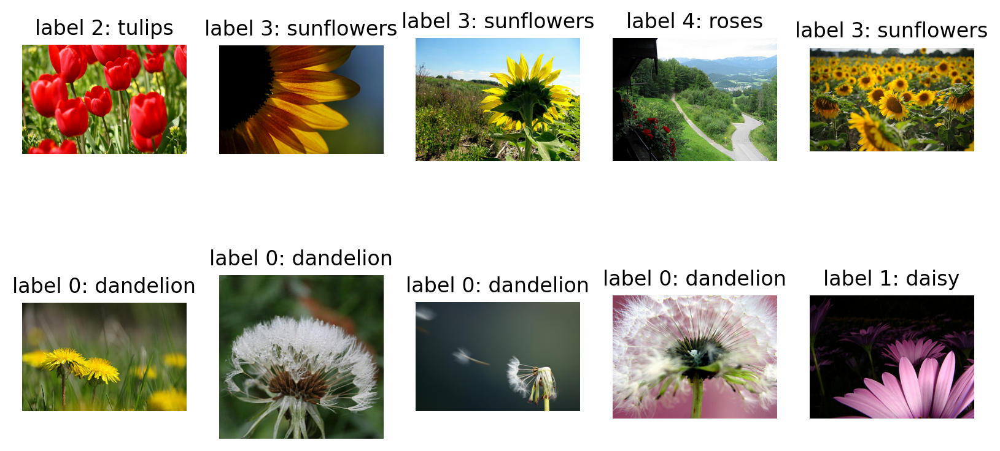

In [ ]:
# raw_train 안에 있는 데이터 확인해보기
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [ ]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)
print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


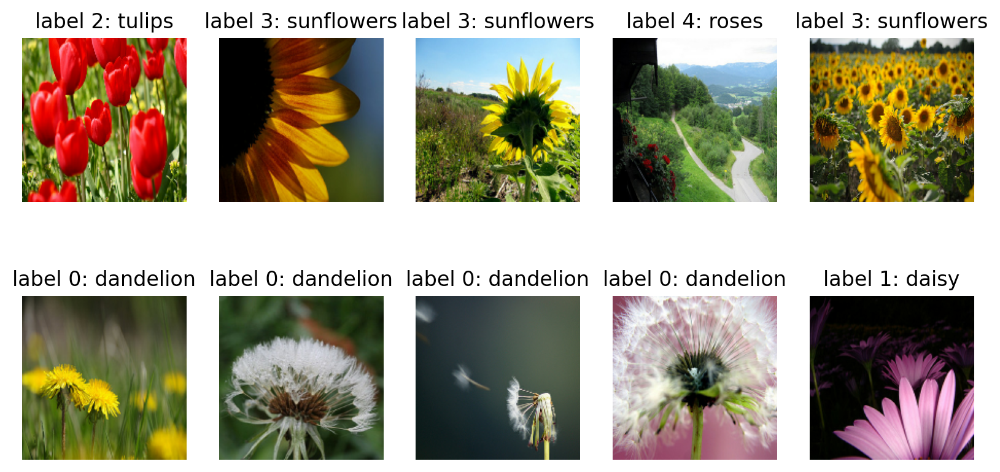

In [ ]:
# 다시 이미지를 시각적으로 확인해 보니 모든 이미지의 크기가 균일해진 것을 확인할 수 있습니다.
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [ ]:
# 한 스텝에 학습시킬 데이터의 개수인 BATCH_SIZE와 학습 데이터를 적절히 섞어줄 SHUFFLE_BUFFER_SIZE를 설정해주겠습니다.
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

# Data Augmentation 추가
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

**Step 3. 모델 설계하기**
- cats_vs_dogs 의 경우와 달리, tf_flowers 데이터셋에서는 class의 갯수가 5가지입니다. 모델 설계시 어느 부분이 달라질지에 유의해 주세요.

In [ ]:
# VGG16 모델 로드 (Feature Extractor)
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [ ]:
# train_batches에서 하나의 batch만 꺼내 데이터를 확인해보기
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [ ]:
# 이미지의 특징을 추출해 낸 "특징 벡터" 부분
# 모델에 이 배치를 넣었을 때 shape 확인- 이미지의 개수는 32장으로 같으나, 이미지의 사이즈가 달라짐
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [ ]:
# classifier를 구성하기 전에 이 3차원 벡터를 1차원 벡터로 변환 (평균값을 활용해 벡터의 차원을 줄이는 방법으로)
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [ ]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [ ]:
# conv base 전체를 초기에는 freeze
base_model.trainable = False

In [ ]:
# 최종 모델
model = tf.keras.Sequential([
    data_augmentation,
    base_model,
    global_average_layer,
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.4),                   # Dropout layer 추가
    tf.keras.layers.Dense(5, activation='softmax')  # 이부분에서 5개로 바꿔준다 : label의 class가 5개이기때문
])

In [ ]:
# Learning Rate Scheduler
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=1000,
    decay_rate=0.9
)

In [ ]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_2 (Sequential)       │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 5, 5, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ ?                      │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

**Step 4. 모델 학습시키기**
- 모델을 학습시켜봅니다. 단, 여기에서는 여러 가지 옵션을 바꿔볼 수 있습니다.
- 예를 들어, 모델 학습을 10 epoch보다 더 많이 시켜보거나, learning_rate 값을 바꿔볼 수 있습니다.
- 또는, optimizer의 종류도 바꿔볼 수 있습니다. 바꿔보고 싶다면, 여기를 참고하세요.
- 어쩌면 VGG16이 아닌 다른 모델을 base model로 활용할 수도 있을 것입니다. 그리고 파인튜닝을 fc layer의 구성에 변화를 줄 수 있을지도 모릅니다.
- 이전 스텝에서는 시도하지 않았던 Regularization 기법이 적용된다면 어떨까요? Dropout이나 Batch Normalization을 적용하는 것은 그리 어려운 일이 아닙니다.

In [ ]:
# 모델을 compile 하여 학습할 수 있는 형태로 변환
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
# 초기 모델의 성능 확인 (loss는 1.70, accuracy는 약 18%)
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.2212 - loss: 1.8284
initial loss: 1.83
initial accuracy: 0.22


In [ ]:
# 5 epoch를 학습한 후, 훈련 데이터셋에 대한 정확도는 약 00% 남짓, 검증 데이터셋에 대한 accuracy는 약 00% 조금 못 미치게 나왔습니다.
history = model.fit(train_batches,
                    epochs=5,
                    validation_data=validation_batches)

Epoch 1/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - accuracy: 0.2569 - loss: 1.6849 - val_accuracy: 0.4550 - val_loss: 1.4153
Epoch 2/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - accuracy: 0.4185 - loss: 1.4060 - val_accuracy: 0.6322 - val_loss: 1.2297
Epoch 3/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - accuracy: 0.5204 - loss: 1.2736 - val_accuracy: 0.6785 - val_loss: 1.0782
Epoch 4/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - accuracy: 0.5933 - loss: 1.1280 - val_accuracy: 0.6894 - val_loss: 0.9702
Epoch 5/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.6365 - loss: 1.0368 - val_accuracy: 0.7248 - val_loss: 0.8942


In [ ]:
# Fine-tuning 단계 (상위 block5만 열기)
base_model.trainable = True

for layer in base_model.layers[:-4*3]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

history_fine = model.fit(
    train_batches,
    epochs=5,
    validation_data=validation_batches
)

Epoch 1/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 21s 182ms/step - accuracy: 0.7185 - loss: 0.7776 - val_accuracy: 0.8202 - val_loss: 0.4880
Epoch 2/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 21s 186ms/step - accuracy: 0.8340 - loss: 0.4543 - val_accuracy: 0.8638 - val_loss: 0.3649
Epoch 3/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 180ms/step - accuracy: 0.8700 - loss: 0.3520 - val_accuracy: 0.8610 - val_loss: 0.4122
Epoch 4/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 182ms/step - accuracy: 0.8914 - loss: 0.3032 - val_accuracy: 0.8719 - val_loss: 0.3486
Epoch 5/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 177ms/step - accuracy: 0.9016 - loss: 0.2621 - val_accuracy: 0.8801 - val_loss: 0.3398


Step 5. 모델 성능 평가하기
- 모델 학습이 완료되었다면, 모델의 성능을 평가할 차례입니다.
- 모델이 학습된 과정을 그래프로도 그려보고, validation_batches나 test_batches에 있는 데이터에 대한 예측 결과도 확인해 보세요!

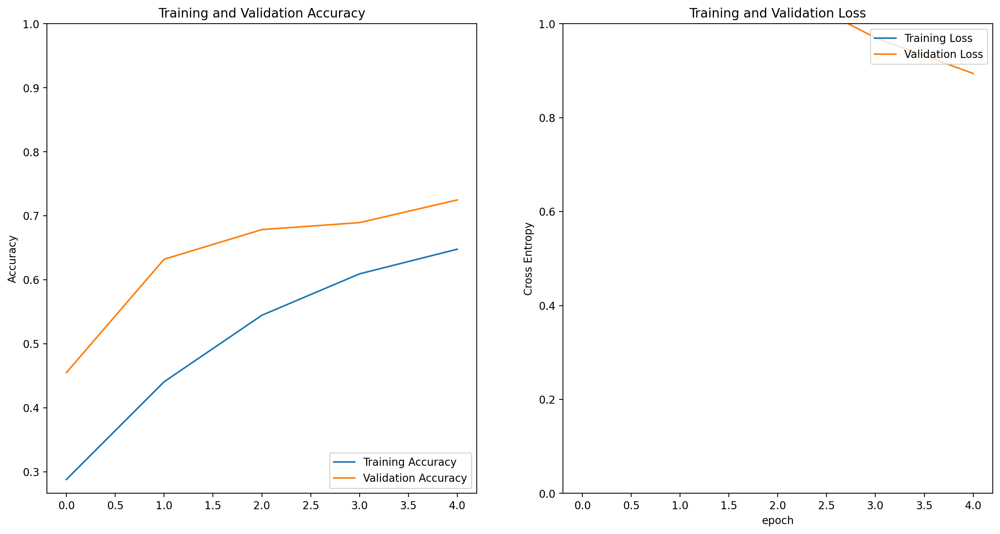

In [ ]:
# 학습 단계에 따른 정확도(accuracy)와 손실값(loss)의 변화 그래프
# 73%를 넘는 정확도로 꾸준히 올라갈뿐더러 validation loss도 감소하는 방향으로 학습됨
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
# 모델의 예측 결과 확인
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


array([[1.6165047e-04, 9.5080677e-04, 9.4779974e-01, 4.5879479e-04,
        5.0628945e-02],
       [9.9999905e-01, 4.9285052e-07, 1.4134470e-09, 4.3309925e-07,
        7.2543132e-09],
       [9.7376841e-01, 7.0694005e-03, 1.4581133e-03, 1.4570388e-02,
        3.1335992e-03],
       [2.5517838e-05, 9.0959552e-04, 9.8676831e-01, 1.2242876e-04,
        1.2174170e-02],
       [9.8019582e-01, 1.4210120e-02, 8.6771860e-04, 2.9335064e-03,
        1.7927795e-03],
       [9.9382764e-01, 2.6842470e-03, 7.6182222e-04, 2.5437642e-03,
        1.8257090e-04],
       [5.6506269e-05, 4.7124928e-04, 9.8880452e-01, 1.6821348e-04,
        1.0499621e-02],
       [2.6602591e-03, 9.9602830e-01, 1.5223825e-06, 1.2911136e-03,
        1.8737264e-05],
       [2.8754503e-04, 7.7565329e-07, 6.1680121e-06, 9.9970514e-01,
        3.3866141e-07],
       [9.9999869e-01, 4.2260064e-07, 2.6703295e-10, 7.9895881e-07,
        1.5484903e-09],
       [9.9566686e-01, 2.1082349e-03, 1.5307398e-04, 1.9187441e-03,
        1.53

In [ ]:
# prediction 값들을 실제 추론한 라벨(dandelion=0, daisy=1, tulips=2, sunflowers=3, roses=4)로 변환
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 0, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       2, 0, 1, 2, 1, 2, 4, 3, 0, 4])

In [ ]:
print(predictions.shape)

(32,)


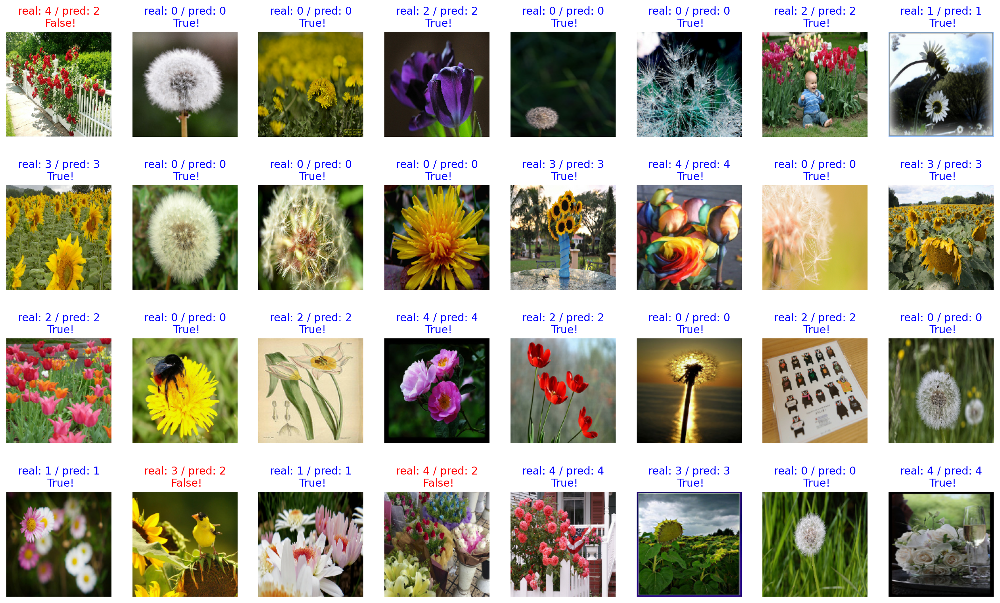

In [ ]:
# 32장의 image들, label, 그리고 prediction을 얻었으니 시각화해서 확인
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)

    # 이미지 복원
    image = (image + 1) / 2
    plt.imshow(image)

    # label은 텐서 → numpy 변환
    label = label.numpy()

    # prediction은 이미 정수이므로 그대로 사용
    prediction = int(prediction)

    # 맞았는지 여부
    correct = (label == prediction)

    title = f'real: {label} / pred: {prediction}\n {correct}!'
    color = 'blue' if correct else 'red'
    plt.title(title, fontdict={'color': color})

    plt.axis('off')

In [ ]:
# 위 32개 이미지에 대해서 예측의 정확도 확인
count = 0

for image, label, prediction in zip(images, labels, predictions):
    label = label.numpy()      # label 텐서를 숫자로 변환
    prediction = int(prediction)  # 이미 argmax된 스칼라이므로 int로 변환만 하면 됨

    if label == prediction:
        count += 1

print(count / 32 * 100)

90.625


**Step 6. 모델 활용하기**
- 모델이 꽤나 똑똑해졌다면, 이제 활용해볼 수 있습니다.
- 원하는 이미지를 자유롭게 모델에 입력해 보고, 어떤 예측 결과를 내는지 확인해 보세요!

Saving my_rose.jpg to my_rose (1).jpg


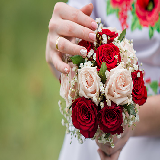

In [64]:
from google.colab import files
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import os

# 1) 업로드
uploaded = files.upload()   # my_rose.jpg 선택하기

# 2) 업로드된 파일 경로 가져오기
rose_image_path = list(uploaded.keys())[0]

# 3) 이미지 로드
IMG_SIZE = 160
rose_image = load_img(rose_image_path, target_size=(IMG_SIZE, IMG_SIZE))
rose_image

In [65]:
# 클래스 이름 매핑
class_names = ["dandelion", "daisy", "tulips", "sunflowers", "roses"]

def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)

    # 이미지 로딩
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')

    # 전처리 (tf_flowers와 동일하게!)
    image_array = img_to_array(image)
    image_array = (image_array / 127.5) - 1   # 모델 학습 시 사용한 방식
    image_array = np.expand_dims(image_array, axis=0)

    # 예측
    prediction = model.predict(image_array)[0]

    print("\nPrediction:")
    for idx, prob in enumerate(prediction):
        print(f"{class_names[idx]} : {round(prob * 100, 2)}%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

Prediction:
dandelion : 0.0%
daisy : 0.029999999329447746%
tulips : 0.800000011920929%
sunflowers : 0.009999999776482582%
roses : 99.16999816894531%


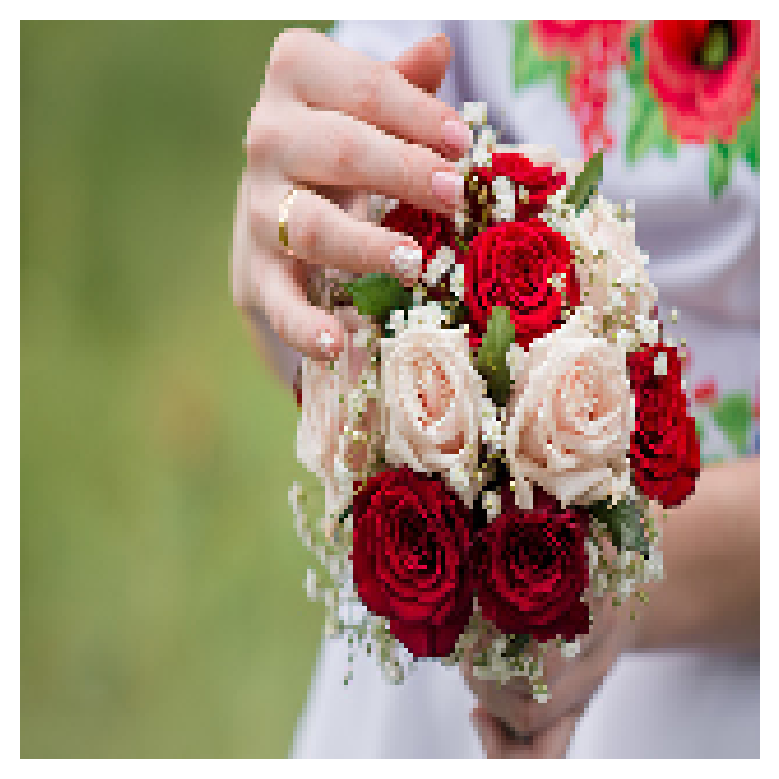

In [66]:
img_dir_path = "."
filename = 'my_rose.jpg'

show_and_predict_image(".", "my_rose.jpg")

내 장미 이미지를 99.17%로 잘 맞췄다.